# Substitution patterns around hotspots

In [1]:
from scipy import signal, stats
import numpy as np
import pandas as pd
import bisect
import importlib
import warnings
from pathlib import Path
import gc

import ete3
np.random.seed(7)

import psutil, os
def mem():
    return psutil.Process(os.getpid()).memory_info().rss / 1024**3

Plotting setup:

In [2]:
%matplotlib inline

# Make inline plots vector graphics instead of raster graphics
from IPython.display import set_matplotlib_formats
#set_matplotlib_formats('pdf', 'svg')
set_matplotlib_formats('retina', 'png')

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
from matplotlib.lines import Line2D

#matplotlib.rcParams['figure.figsize'] = (20.0, 10.0)

import mpld3

import seaborn as sns
sns.set() # sets seaborn default "prettyness:
sns.set_style("white")
sns.set_context("notebook")

# lowess for plotting
from statsmodels.nonparametric.smoothers_lowess import lowess


def abline(slope, intercept, ax=None):
    "Add a straight line through the plot"
    if ax is None:
        ax = plt.gca()
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '--', color='grey')
    
def add_lowess(x, y, ax=None, color=None, is_sorted=True, frac=0.005, it=0, **kwargs):
    "Add a lowess curve to the plot"
    if ax is None:
        ax = plt.gca() 
    filtered = lowess(y, x, is_sorted=is_sorted, frac=frac, it=it, **kwargs)
    ax.plot(filtered[:,0], filtered[:,1])

def add_band(x_low, x_high, ax=None, color='gray', linewidth=0, alpha=0.5, zorder=0, **kwargs):
    "Plot a gray block on x interval"
    if ax is None:
        ax = plt.gca()
    y_low, y_high = ax.get_ylim()
    g = ax.add_patch(Rectangle((x_low, y_low), x_high-x_low, y_high-y_low, 
                 facecolor=color,
                 linewidth=linewidth,
                 alpha=alpha,
                 zorder=zorder))

def stairs(df, start='start', end='end', pos='pos', endtrim=0):
    "Turn a df with start, end into one with pos to plot as stairs"
    df1 = df.copy(deep=True)
    df2 = df.copy(deep=True)
    df1[pos] = df1[start]
    df2[pos] = df2[end] - endtrim
    return pd.concat([df1, df2]).sort_values([start, end])

# My own paired palette replacing the last brown pair with violets
sns.color_palette('Paired').as_hex()
Paired = sns.color_palette(['#a6cee3', '#1f78b4', '#b2df8a', '#33a02c', '#fb9a99', '#e31a1c',
                            '#fdbf6f', '#ff7f00', '#cab2d6','#6a3d9a', '#e585cf', '#ad009d'])
#sns.palplot(Paired)

Monospace font for numbers in tables:

In [3]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

For reducing memory of data frames:

In [4]:
def optimize_data_frame(df, inplace=False, down_int='integer'):
    # down_int can be 'unsigned'
    
    if inplace:
        converted_df = df
    else:
        converted_df = pd.DataFrame()

    floats_optim = (df
                    .select_dtypes(include=['float'])
                    .apply(pd.to_numeric,downcast='float')
                   )
    converted_df[floats_optim.columns] = floats_optim

    ints_optim = (df
                    .select_dtypes(include=['int'])
                    .apply(pd.to_numeric,downcast=down_int)
                   )
    converted_df[ints_optim.columns] = ints_optim

    for col in df.select_dtypes(include=['object']).columns:
        num_unique_values = len(df[col].unique())
        num_total_values = len(df[col])
        if num_unique_values / num_total_values < 0.5:
            converted_df[col] = df[col].astype('category')
        else:
            converted_df[col] = df[col]

    unchanged_cols = df.columns[~df.columns.isin(converted_df.columns)]
    converted_df[unchanged_cols] = df[unchanged_cols]

    # keep columns order
    converted_df = converted_df[df.columns]      
            
    return converted_df

## Data dir

In [5]:
data_path = Path('/project/Birds/faststorage/data')
results_path = Path('/project/Birds/faststorage/people/kmt/results')

## Load substitution data

Define column sets:

In [6]:
base_counts = ['nA', 'nG', 'nT', 'nC']

substitution_counts =  ['nA2C', 'nA2G', 'nA2T', 'nC2A', 'nC2G', 'nC2T',
                        'nG2A', 'nG2C', 'nG2T', 'nT2A', 'nT2C', 'nT2G']
cpg_substitution_counts =  ['nA2c', 'nA2g', 'nc2A', 'nc2g', 'nc2T',
                            'ng2A', 'ng2c', 'ng2T', 'nT2c', 'nT2g']
# in paired order
substitutions = ['rA2C', 'rT2G',
                 'rC2T', 'rG2A',
                 'rA2G', 'rT2C',
                 'rA2T', 'rT2A', 
                 'rC2A', 'rG2T',
                 'rC2G', 'rG2C']
# cpg_substitutions = ['rA2c', 'rT2g',
#                      'rc2T', 'rg2A',
#                      'rA2g', 'rT2c',
#                      'rc2A', 'rg2T',
#                      'rc2g', 'rg2c']


transitions = ['rA2G', 'rG2A', 'rT2C', 'rC2T']
# cpg_transitions = ['rA2g', 'rg2A', 'rT2c', 'rc2T']

transversions = [x for x in substitutions if x not in transitions]
# cpg_transversions = [x for x in cpg_substitutions if x not in cpg_transitions]

paired_patterns = [('rT2G', 'rA2C'),
                   ('rA2G', 'rT2C'),
                   ('rA2T', 'rT2A'), 
                   ('rG2T', 'rC2A'),
                   ('rC2G', 'rG2C'), 
                   ('rC2T', 'rG2A')]
# cpg_paired_patterns = [('rT2g', 'rA2c'),
#                        ('rA2g', 'rT2c'),
#                        ('rg2T', 'rc2A'),
#                        ('rc2g', 'rg2c'), 
#                        ('rc2T', 'rg2A')]

We exclude the eagles and windows smaller than 1000 (split windows overlapping midpoint between two hotspots):

In [96]:
def data_filter(df):
    include_species = ~df.species.isin(['HALAL'])
    win_size = (df.end - df.start).abs()
    include_window = (win_size == 1000) | (win_size == 0)
    return include_species & include_window
    
hotspot_data = (pd.read_hdf(results_path / 'hotspot_data.h5')
                .loc[data_filter]
               )
hotspot_data.species.cat.remove_unused_categories(inplace=True)

In [97]:
hotspot_data['hotspot_center'] = (hotspot_data.start_prox + (hotspot_data.end_prox - hotspot_data.start_prox) / 2).astype('int32')

In [115]:
pd.Series([501]).round(-3)

0    1000
dtype: int64

In [ ]:


    
#     # there can be more than one hotspot center in each
#     query_overlap.drop_duplicates(subset=['chrom', 'start_orig', 'prox_start'], keep="first", inplace=True)

    

Load distances to CGIs, promoters, TES, and TSS:

In [98]:
# cgi_data = (pd.read_hdf(results_path / 'cgi_data.h5')
#                 .loc[lambda df: ~df.species.isin(['HALAL']), 
#                      ['species', 'chrom', 'start_orig', 'end_orig', 'start', 'end', 'start_prox', 'end_prox']]
#                )
# cgi_data.species.cat.remove_unused_categories(inplace=True)

# promoter_data = (pd.read_hdf(results_path / 'promoter_data.h5')
#                 .loc[lambda df: ~df.species.isin(['HALAL']), 
#                      ['species', 'chrom', 'start_orig', 'end_orig', 'start', 'end', 'start_prox', 'end_prox']]
#                )
# promoter_data.species.cat.remove_unused_categories(inplace=True)

# tss_data = (pd.read_hdf(results_path / 'tss_data.h5')
#                 .loc[lambda df: ~df.species.isin(['HALAL']), 
#                      ['species', 'chrom', 'start_orig', 'end_orig', 'start', 'end', 'start_prox', 'end_prox']]
#                )
# tss_data.species.cat.remove_unused_categories(inplace=True)

# tes_data = (pd.read_hdf(results_path / 'tes_data.h5')
#                 .loc[lambda df: ~df.species.isin(['HALAL']), 
#                      ['species', 'chrom', 'start_orig', 'end_orig', 'start', 'end', 'start_prox', 'end_prox']]
#                )
# tes_data.species.cat.remove_unused_categories(inplace=True)

Merge that data on like this:

In [99]:
len(sorted(hotspot_data.species.unique().tolist()))

47

In [100]:
hotspot_data.head()

,ancestor,bin,chrom,end,end_orig,end_prox,nA,nA2C,nA2G,nA2T,...,ng2c,ng_tot,pos,species,start,start_orig,start_prox,branch_length,ultra_branch_length,hotspot_center
0,Anc16,0.0,1,0,6895000,6894116,7,0,0,0,...,0,0,0.0,MESUN,0,6894000,6894116,0.087125,0.053181,6894116
1,Anc16,0.0,1,0,8806000,8805005,297,3,8,2,...,0,8,0.0,MESUN,0,8805000,8805005,0.087125,0.053181,8805005
2,Anc16,0.0,1,0,9688000,9687030,255,3,10,4,...,0,11,0.0,MESUN,0,9687000,9687030,0.087125,0.053181,9687030
3,Anc16,0.0,1,0,10398000,10397061,257,1,11,6,...,0,4,0.0,MESUN,0,10397000,10397061,0.087125,0.053181,10397061
4,Anc16,0.0,1,0,10504000,10503751,115,0,6,5,...,1,25,0.0,MESUN,0,10503000,10503751,0.087125,0.053181,10503751


------

In [101]:
#hotspot_data.loc[hotspot_data.bin == 0].groupby(['chrom', 'species', 'hotspot_center']).nA.count().reset_index().groupby('species').hotspot_center.unique()#.agg(lambda df: df.hotpos_center.unique())

In [102]:
#hotspot_data.loc[hotspot_data.bin == 0].groupby(['species', 'bin']).hotspot_center.count()#.loc[lambda x: x != 47]

In [110]:
df_0 = hotspot_data.loc[(hotspot_data.bin == 0)]
dp = df_0.duplicated(subset=['chrom', 'species', 'hotspot_center'])
df_0.loc[dp, ['chrom', 'species', 'hotspot_center']].reset_index().sort_values(['chrom', 'species', 'hotspot_center'])

,index,chrom,species,hotspot_center
45,35670453,9,ACACH,11341000
25,19725573,9,ANAPL,11341000
22,17447733,9,ANTCA,11341000
29,22762693,9,APAVI,11341000
3,3021413,9,APTFO,11341000
12,9854933,9,BALRE,11341000
31,24281253,9,BUCRH,11341000
1,1502853,9,CALAN,11341000
16,12892053,9,CARCR,11341000
42,33392613,9,CATAU,11341000


In [111]:
df_0.loc[df_0.hotspot_center == 11341000, ['bin', 'chrom', 'species', 'start', 'end', 'pos', 'start_orig', 'end_orig', 'start_prox', 'end_prox']]

,bin,chrom,species,start,end,pos,start_orig,end_orig,start_prox,end_prox
2678,0.0,9,MESUN,0,0,0.0,11341000,11342000,11341000,11341000
743573,0.0,9,MESUN,0,-1000,-500.0,11340000,11341000,11341000,11341000
761958,0.0,9,CALAN,0,0,0.0,11341000,11342000,11341000,11341000
1502853,0.0,9,CALAN,0,-1000,-500.0,11340000,11341000,11341000,11341000
1521238,0.0,9,EGRGA,0,0,0.0,11341000,11342000,11341000,11341000
2262133,0.0,9,EGRGA,0,-1000,-500.0,11340000,11341000,11341000,11341000
2280518,0.0,9,APTFO,0,0,0.0,11341000,11342000,11341000,11341000
3021413,0.0,9,APTFO,0,-1000,-500.0,11340000,11341000,11341000,11341000
3039798,0.0,9,PELCR,0,0,0.0,11341000,11342000,11341000,11341000
3780693,0.0,9,PELCR,0,-1000,-500.0,11340000,11341000,11341000,11341000


In [112]:
hotspot_data.loc[hotspot_data.bin == 0].groupby(['chrom', 'species', 'hotspot_center']).nA.count().loc[lambda x: x != 1]

chrom  species  hotspot_center
9      ACACH    11341000          2
       ANAPL    11341000          2
       ANTCA    11341000          2
       APAVI    11341000          2
       APTFO    11341000          2
       BALRE    11341000          2
       BUCRH    11341000          2
       CALAN    11341000          2
       CARCR    11341000          2
       CATAU    11341000          2
       CHAPE    11341000          2
       CHAVO    11341000          2
       CHLMA    11341000          2
       COLLI    11341000          2
       COLST    11341000          2
       CORBR    11341000          2
       CUCCA    11341000          2
       EGRGA    11341000          2
       EURHE    11341000          2
       FALPE    11341000          2
       FULGL    11341000          2
       GALGA    11341000          2
       GAVST    11341000          2
       GEOFO    11341000          2
       HALLE    11341000          2
       LEPDI    11341000          2
       MANVI    11341000         

In [106]:
#hotspot_data.loc[hotspot_data.bin.abs() < 10000].groupby('bin').hotspot_center.agg(lambda x: x.unique())
hotspot_data.loc[hotspot_data.bin.abs() < 10000].groupby('bin').hotspot_center.agg(lambda x: x.unique().size)

bin
-9000.0    2684
-8000.0    2706
-7000.0    2727
-6000.0    2756
-5000.0    2770
-4000.0    2792
-3000.0    2806
-2000.0    2822
-1000.0    2838
 0.0       2856
 1000.0    2833
 2000.0    2820
 3000.0    2801
 4000.0    2789
 5000.0    2760
 6000.0    2740
 7000.0    2725
 8000.0    2704
 9000.0    2681
Name: hotspot_center, dtype: int32

----

Add species names:

In [18]:
species_details = pd.read_csv('/home/kmt/Birds/faststorage/data/species_details.txt', sep='\t')

hotspot_data['species_code'] = hotspot_data.species
name_mapping = dict(zip(species_details.species2014, species_details.english))
hotspot_data['species'] = [name_mapping[x] for x in hotspot_data.species_code]

hotspot_data['species'] = hotspot_data['species'].astype('category')

In [19]:
# hotspot_data['hotspot_id'] = pd.Categorical(hotspot_data.chrom.str.cat([hotspot_data.start_orig.apply(str),
#                                                                         hotspot_data.end_orig.apply(str)],
#                                                                         sep='_')

In [20]:
hotspot_data.head()

,ancestor,bin,chrom,end,end_orig,end_prox,nA,nA2C,nA2G,nA2T,...,ng_tot,pos,species,start,start_orig,start_prox,branch_length,ultra_branch_length,hotspot_center,species_code
0,Anc16,0.0,1,0,6895000,6894116,7,0,0,0,...,0,0.0,Brown Mesite,0,6894000,6894116,0.087125,0.053181,6894116,MESUN
1,Anc16,0.0,1,0,8806000,8805005,297,3,8,2,...,8,0.0,Brown Mesite,0,8805000,8805005,0.087125,0.053181,8805005,MESUN
2,Anc16,0.0,1,0,9688000,9687030,255,3,10,4,...,11,0.0,Brown Mesite,0,9687000,9687030,0.087125,0.053181,9687030,MESUN
3,Anc16,0.0,1,0,10398000,10397061,257,1,11,6,...,4,0.0,Brown Mesite,0,10397000,10397061,0.087125,0.053181,10397061,MESUN
4,Anc16,0.0,1,0,10504000,10503751,115,0,6,5,...,25,0.0,Brown Mesite,0,10503000,10503751,0.087125,0.053181,10503751,MESUN


Compute the number of aligned bases in each window:

In [21]:
hotspot_data['nr_aligned'] = hotspot_data[base_counts].sum(axis=1)

Compute substitution rates across each external branch by dividing substitution counts by the ancestral count of the base substituted from:

In [22]:
for subst in substitution_counts:
    from_base, to_base = subst[1], subst[3]
    
    adding_subst = [x for x in substitution_counts if x[3] == from_base]
    removing_subst = [x for x in substitution_counts if x[1] == from_base]
    
    hotspot_data[subst.replace('n', 'r')] = hotspot_data[subst] / \
        (hotspot_data['n' + from_base] - hotspot_data[adding_subst].sum(axis=1) + hotspot_data[removing_subst].sum(axis=1))

In [23]:
hotspot_data.head()

,ancestor,bin,chrom,end,end_orig,end_prox,nA,nA2C,nA2G,nA2T,...,rA2T,rC2A,rC2G,rC2T,rG2A,rG2C,rG2T,rT2A,rT2C,rT2G
0,Anc16,0.0,1,0,6895000,6894116,7,0,0,0,...,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.076923,0.076923
1,Anc16,0.0,1,0,8806000,8805005,297,3,8,2,...,0.006689,0.006849,0.006849,0.054795,0.050000,0.006250,0.006250,0.007905,0.027668,0.015810
2,Anc16,0.0,1,0,9688000,9687030,255,3,10,4,...,0.015152,0.016667,0.016667,0.027778,0.025000,0.030000,0.025000,0.000000,0.021277,0.003546
3,Anc16,0.0,1,0,10398000,10397061,257,1,11,6,...,0.022989,0.013636,0.013636,0.081818,0.052326,0.011628,0.034884,0.006969,0.024390,0.017422
4,Anc16,0.0,1,0,10504000,10503751,115,0,6,5,...,0.043860,0.032051,0.019231,0.070513,0.039683,0.000000,0.023810,0.014493,0.028986,0.007246


Make a copy of the entire data frame and do the same but including CpG sites:

In [24]:
hotspot_data_incl_cpg = hotspot_data.copy(deep=True)

for subst in substitution_counts:
    from_base, to_base = subst[1], subst[3]
    
    adding_subst = [x for x in substitution_counts+cpg_substitution_counts if x[3].upper() == from_base]
    removing_subst = [x for x in substitution_counts+cpg_substitution_counts if x[1].upper() == from_base]
    
    same_subst = [x for x in substitution_counts+cpg_substitution_counts if x[1:].upper() == subst[1:]]
   
    from_base_count = hotspot_data['n' + from_base]
    if from_base in 'GC':
        from_base_count += hotspot_data['n' + from_base.lower()]

    hotspot_data_incl_cpg[subst.replace('n', 'r')] = hotspot_data[same_subst].sum(axis=1) / \
            (from_base_count - hotspot_data[adding_subst].sum(axis=1) + hotspot_data[removing_subst].sum(axis=1))    

In [25]:
hotspot_data_incl_cpg.head()

,ancestor,bin,chrom,end,end_orig,end_prox,nA,nA2C,nA2G,nA2T,...,rA2T,rC2A,rC2G,rC2T,rG2A,rG2C,rG2T,rT2A,rT2C,rT2G
0,Anc16,0.0,1,0,6895000,6894116,7,0,0,0,...,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.076923,0.076923
1,Anc16,0.0,1,0,8806000,8805005,297,3,8,2,...,0.006711,0.006452,0.006135,0.058480,0.065089,0.005650,0.005405,0.007937,0.027778,0.019841
2,Anc16,0.0,1,0,9688000,9687030,255,3,10,4,...,0.015094,0.015707,0.014851,0.037559,0.028571,0.027149,0.021552,0.000000,0.031915,0.003546
3,Anc16,0.0,1,0,10398000,10397061,257,1,11,6,...,0.023438,0.017621,0.012987,0.085106,0.077778,0.010870,0.037234,0.007018,0.024561,0.021053
4,Anc16,0.0,1,0,10504000,10503751,115,0,6,5,...,0.044643,0.038043,0.019139,0.059829,0.051948,0.005587,0.024510,0.014925,0.037313,0.007463


In [26]:
mem()

14.187114715576172

Make a long format data frames with substitution rate data within 50kb from each hotspot:

In [27]:
id_cols = ['species', 'species_code', 'ancestor', 'hotspot_center', 'bin', 'branch_length', 'ultra_branch_length', 'nr_aligned']
subst_data = (hotspot_data
              .loc[lambda df: df.bin.abs() <= 40000, id_cols + substitutions + base_counts]
              .melt(id_vars=id_cols,
                    value_vars=substitutions,
                    var_name='pattern', value_name='rate')
             )
subst_data['pattern'] = pd.Categorical(subst_data.pattern.values, 
                                       categories=substitutions, ordered=True)
subst_data.loc[subst_data.pattern.isin(transitions), 'type'] = 'Transition'
subst_data.loc[~subst_data.pattern.isin(transitions), 'type'] = 'Transversion'
subst_data['type'] = pd.Categorical(subst_data.type.values, categories=['Transition', 'Transversion'], ordered=True)
subst_data.head()

,species,species_code,ancestor,hotspot_center,bin,branch_length,ultra_branch_length,nr_aligned,pattern,rate,type
0,Brown Mesite,MESUN,Anc16,6894116,0.0,0.087125,0.053181,35,rA2C,0.000000,Transversion
1,Brown Mesite,MESUN,Anc16,8805005,0.0,0.087125,0.053181,858,rA2C,0.010033,Transversion
2,Brown Mesite,MESUN,Anc16,9687030,0.0,0.087125,0.053181,926,rA2C,0.011364,Transversion
3,Brown Mesite,MESUN,Anc16,10397061,0.0,0.087125,0.053181,940,rA2C,0.003831,Transversion
4,Brown Mesite,MESUN,Anc16,10503751,0.0,0.087125,0.053181,534,rA2C,0.000000,Transversion


In [28]:
subst_data_incl_cpg = (hotspot_data_incl_cpg
              .loc[lambda df: df.bin.abs() <= 40000, id_cols + substitutions + base_counts]
              .melt(id_vars=id_cols,
                    value_vars=substitutions,
                    var_name='pattern', value_name='rate')
             )
subst_data_incl_cpg['pattern'] = pd.Categorical(subst_data_incl_cpg.pattern.values, 
                                       categories=substitutions, ordered=True)
subst_data_incl_cpg.loc[subst_data.pattern.isin(transitions), 'type'] = 'Transition'
subst_data_incl_cpg.loc[~subst_data.pattern.isin(transitions), 'type'] = 'Transversion'
subst_data_incl_cpg['type'] = pd.Categorical(subst_data_incl_cpg.type.values, categories=['Transition', 'Transversion'], ordered=True)
subst_data_incl_cpg.head()

,species,species_code,ancestor,hotspot_center,bin,branch_length,ultra_branch_length,nr_aligned,pattern,rate,type
0,Brown Mesite,MESUN,Anc16,6894116,0.0,0.087125,0.053181,35,rA2C,0.000000,Transversion
1,Brown Mesite,MESUN,Anc16,8805005,0.0,0.087125,0.053181,858,rA2C,0.013423,Transversion
2,Brown Mesite,MESUN,Anc16,9687030,0.0,0.087125,0.053181,926,rA2C,0.011321,Transversion
3,Brown Mesite,MESUN,Anc16,10397061,0.0,0.087125,0.053181,940,rA2C,0.003906,Transversion
4,Brown Mesite,MESUN,Anc16,10503751,0.0,0.087125,0.053181,534,rA2C,0.008929,Transversion


## Number of aligned bases in each 1kb window

Distribution of number of aligned bases in windows for TAEGU:

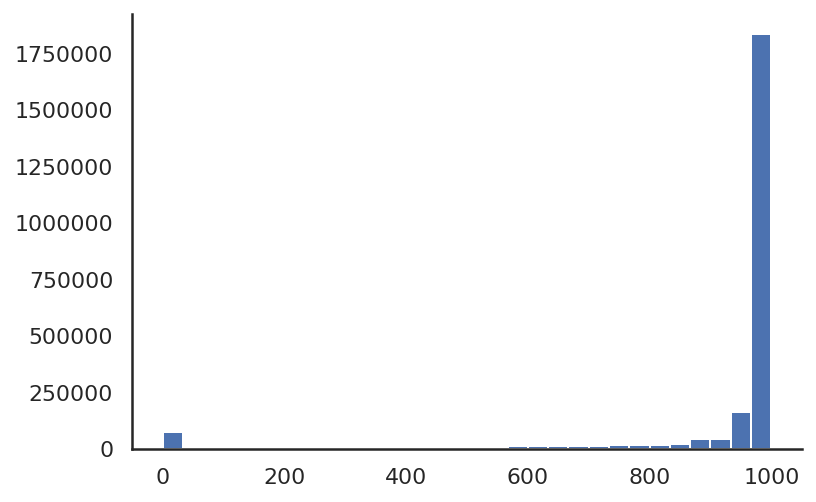

In [29]:
plt.hist(subst_data.loc[subst_data.species_code == 'TAEGU'].nr_aligned, bins=30)
sns.despine()

Distribution of number of aligned bases in windows for all others:

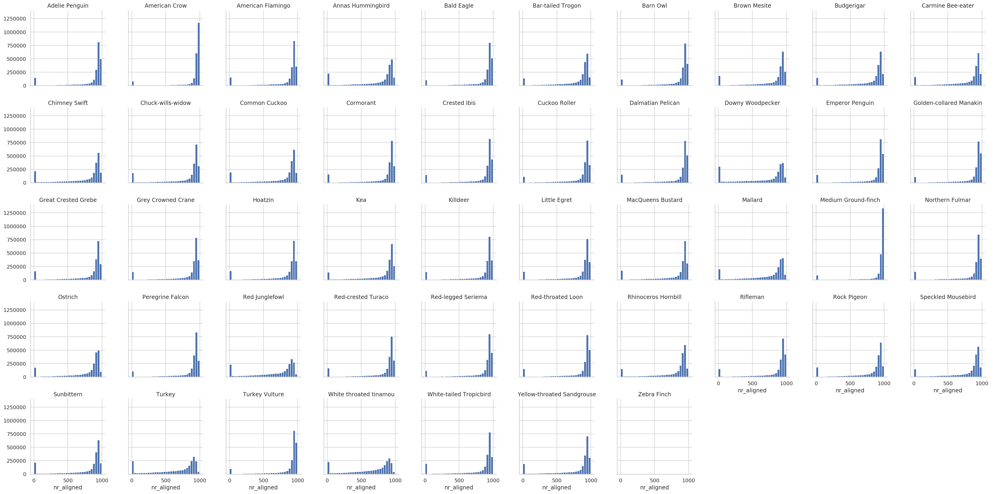

In [30]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(subst_data.loc[subst_data.species_code != 'TAEGU'], col='species', col_wrap=10, sharey=True)
    g.map(plt.hist, 'nr_aligned', bins=30).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

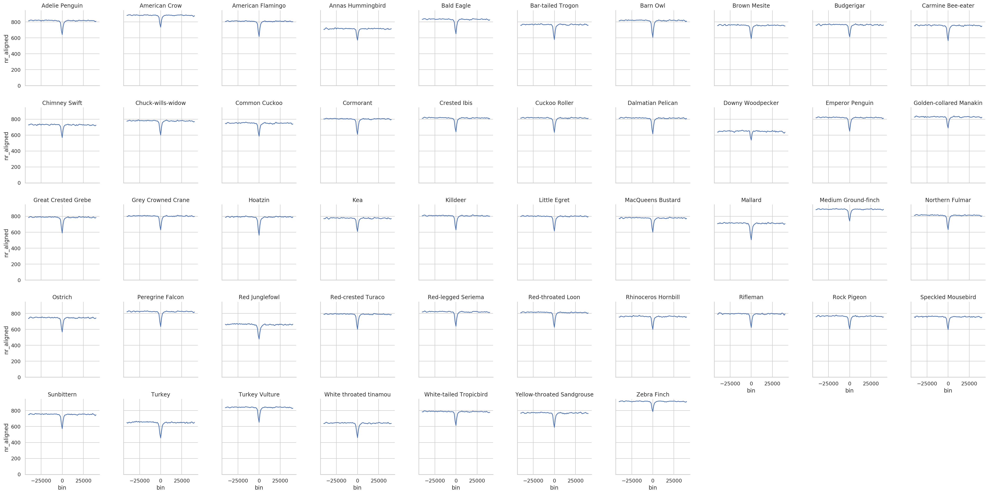

In [31]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(subst_data,
                      col='species', col_wrap=10, sharey=True)
    g.map(sns.lineplot, 'bin', 'nr_aligned', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    [ax.set_ylim(bottom=0) for ax in g.axes.flat]

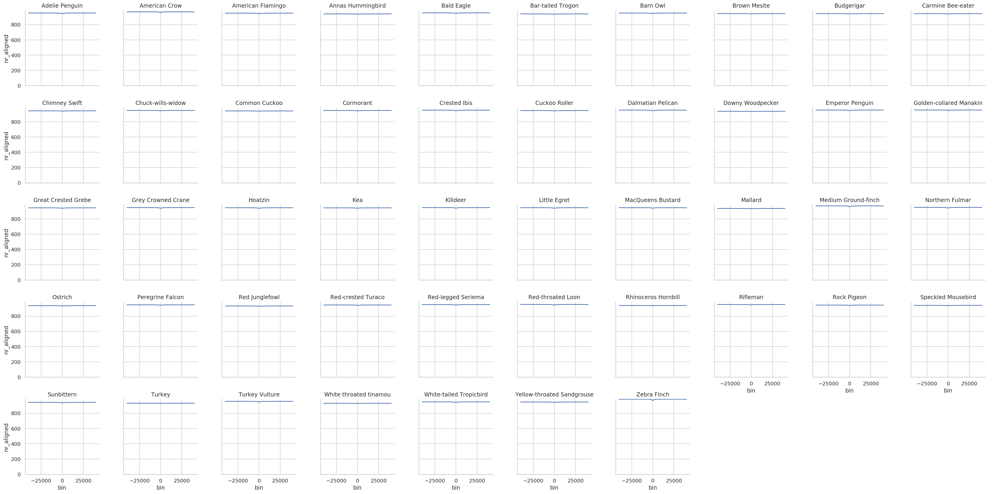

In [32]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(subst_data.loc[subst_data.nr_aligned >= 900],
                      col='species', col_wrap=10, sharey=True)
    g.map(sns.lineplot, 'bin', 'nr_aligned', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;
    [ax.set_ylim(bottom=0) for ax in g.axes.flat]

It seems there are important differences in the alignemnt quality in the different species. Especially with some of the long branches. 

We will be asked how much of the differences we find are due to misalignemnts. Th that we can say that any misalignment to inflate all substitution rates at hotspots not just a few. As we show further down, the A2T and T2A substitution rates are constant across the hotspots.

## Filter low coverage windows

We use only windows where with at least 300 aligned bases. (below we also test if this cutoff matters to the patterns observed)

In [33]:
removed_rows = subst_data[subst_data.nr_aligned < 300].index
subst_data.drop(removed_rows, inplace=True)

## Normalize rates with branch length

Normalize each substitution rate with a global mutation rate divided by the external branch length. 

By dividing by branch length we take variation in overall subsititution rate into account. This should make the summed substitituion rates outside hotspots should be the same across species.

In [34]:
# subst_data['rate'] *= 2.3e-9 / subst_data.branch_length * 1e9 
subst_data['rate'] /= subst_data.branch_length

optimize_data_frame(subst_data, inplace=True)
subst_data.head()

,species,species_code,ancestor,hotspot_center,bin,branch_length,ultra_branch_length,nr_aligned,pattern,rate,type
1,Brown Mesite,MESUN,Anc16,8805005,0.0,0.087125,0.053181,858,rA2C,0.115162,Transversion
2,Brown Mesite,MESUN,Anc16,9687030,0.0,0.087125,0.053181,926,rA2C,0.130430,Transversion
3,Brown Mesite,MESUN,Anc16,10397061,0.0,0.087125,0.053181,940,rA2C,0.043976,Transversion
4,Brown Mesite,MESUN,Anc16,10503751,0.0,0.087125,0.053181,534,rA2C,0.000000,Transversion
6,Brown Mesite,MESUN,Anc16,10878154,0.0,0.087125,0.053181,908,rA2C,0.178227,Transversion


See if the summed substitituion rates outside hotspots are the same across species:

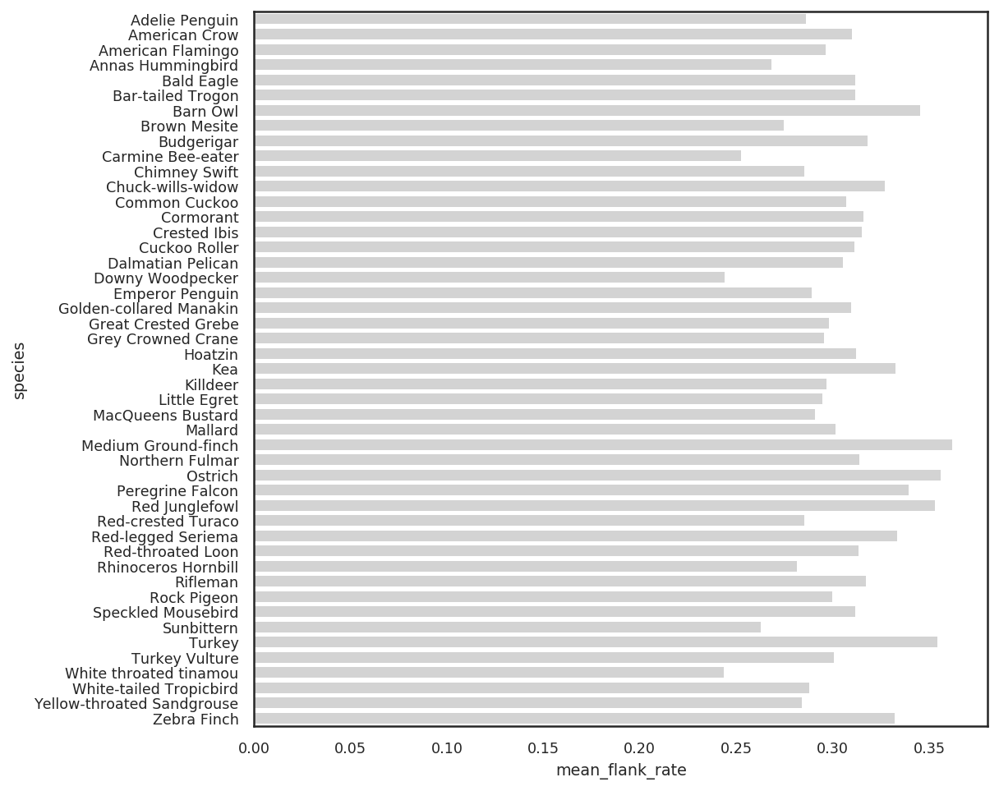

In [35]:
mean_flank_rates = (subst_data
                    .loc[subst_data.bin.abs() > 20000]
                    .groupby('species')
                    .rate
                    .mean()
                    .reset_index()
                    .rename(columns={'rate': 'mean_flank_rate'})
                    )
with sns.plotting_context('notebook', font_scale=0.8):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax = sns.barplot(y="species", x="mean_flank_rate", data=mean_flank_rates, color='lightgrey')

It does not seem to be the case... 

**TODO: Maybe it would make more sense to normalize rates with the summed rates outside hotspots, since we are only interested in the relative rates:**


In [36]:
# subst_data = subst_data.merge(mean_flank_rates, on=['species'], how='left')

In [37]:
# # undo prev normalization
# subst_data['rate'] /= 2.3e-9 / subst_data.branch_length * 1e9 

# # normalize by mean flank rate of all substitutions
# subst_data['rate'] /= subst_data.mean_flank_rate / 12

In [38]:
# mean_flank_rates_redone = (subst_data
#                     .loc[subst_data.bin.abs() > 20000]
#                     .groupby('species')
#                     .rate
#                     .mean()
#                     .reset_index()
#                     .rename(columns={'rate': 'mean_flank_rate'})
#                     )
# with sns.plotting_context('notebook', font_scale=0.8):
#     fig, ax = plt.subplots(figsize=(8, 8))
#     ax = sns.barplot(y="species", x="mean_flank_rate", data=mean_flank_rates_redone, color='lightgrey')

## Pivot to get table with column for each pattern

Rates are means across windows in the same position across hotspots.

In [39]:
# # all columns except CpG:
# cols = [col for col in subst_data.columns.values if col not in cpg_substitutions + cpg_substitution_counts]

# # all columns except non-CpG:
# cpg_cols = [col for col in subst_data.columns.values if col not in substitutions + substitution_counts]

In [40]:
rate_table = pd.pivot_table(subst_data,
                            index=['species', 'species_code', 'bin'], columns='pattern', values='rate')
rate_table.columns = rate_table.columns.astype('str')
for a, b in paired_patterns:
    rate_table[f'{a}-{b}'] = rate_table[a] - rate_table[b]
rate_table.head()

pattern                                   rA2C      rT2G      rC2T      rG2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.126614  0.131061  0.642745  0.621231   
                            -39000.0  0.132011  0.129648  0.640722  0.651423   
                            -38000.0  0.128507  0.127389  0.607476  0.625928   
                            -37000.0  0.129947  0.135289  0.651531  0.633803   
                            -36000.0  0.133210  0.129998  0.636656  0.662669   

pattern                                   rA2G      rT2C      rA2T      rT2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.472163  0.458668  0.123635  0.125158   
                            -39000.0  0.454775  0.464401  0.126787  0.122313   
                            -38000.0  0.451102  0.470789  0.120544  0.123782   
                            -37000.0  0.468759  0.485240  0.130887  0.130782   
                            -36000.0  0.472371  0.473565  0.123196  0.117062   

pattern                                   rC2A      rG2T      rC2G      rG2C  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.193846  0.199888  0.180170  0.186427   
                            -39000.0  0.186953  0.182281  0.171876  0.182217   
                            -38000.0  0.186632  0.183627  0.159166  0.170306   
                            -37000.0  0.173515  0.187558  0.178722  0.179205   
                            -36000.0  0.189784  0.185799  0.183596  0.187289   

pattern                               rT2G-rA2C  rA2G-rT2C  rA2T-rT2A  \
species        species_code bin                                         
Adelie Penguin PYGAD        -40000.0   0.004448   0.013495  -0.001523   
                            -39000.0  -0.002362  -0.009626   0.004475   
                            -38000.0  -0.001118  -0.019687  -0.003238   
                            -37000.0   0.005342  -0.016482   0.000106   
                            -36000.0  -0.003213  -0.001194   0.006134   

pattern                               rG2T-rC2A  rC2G-rG2C  rC2T-rG2A  
species        species_code bin                                        
Adelie Penguin PYGAD        -40000.0   0.006041  -0.006257   0.021514  
                            -39000.0  -0.004671  -0.010341  -0.010701  
                            -38000.0  -0.003005  -0.011140  -0.018452  
                            -37000.0   0.014043  -0.000483   0.017728  
                            -36000.0  -0.003985  -0.003693  -0.026013

In [41]:
rate_table_incl_cpg = pd.pivot_table(subst_data_incl_cpg,
                            index=['species', 'species_code', 'bin'], columns='pattern', values='rate')
rate_table_incl_cpg.columns = rate_table_incl_cpg.columns.astype('str')
for a, b in paired_patterns:
    rate_table_incl_cpg[f'{a}-{b}'] = rate_table_incl_cpg[a] - rate_table_incl_cpg[b]
rate_table_incl_cpg.head()

pattern                                   rA2C      rT2G      rC2T      rG2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.002249  0.002472  0.010557  0.010940   
                            -39000.0  0.002375  0.002722  0.010221  0.011288   
                            -38000.0  0.002414  0.002279  0.009771  0.011232   
                            -37000.0  0.002256  0.002353  0.010609  0.011170   
                            -36000.0  0.002302  0.002333  0.010139  0.011410   

pattern                                   rA2G      rT2C      rA2T      rT2A  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.009757  0.009538  0.001634  0.001669   
                            -39000.0  0.009579  0.009545  0.001771  0.001626   
                            -38000.0  0.009234  0.009909  0.001638  0.001625   
                            -37000.0  0.009775  0.010086  0.001769  0.001760   
                            -36000.0  0.009748  0.009682  0.001639  0.001567   

pattern                                   rC2A      rG2T      rC2G      rG2C  \
species        species_code bin                                                
Adelie Penguin PYGAD        -40000.0  0.002753  0.002465  0.002259  0.002271   
                            -39000.0  0.002599  0.002364  0.002110  0.002360   
                            -38000.0  0.002846  0.002296  0.001969  0.002197   
                            -37000.0  0.002427  0.002388  0.002337  0.002233   
                            -36000.0  0.002644  0.002374  0.002283  0.002294   

pattern                               rT2G-rA2C  rA2G-rT2C  rA2T-rT2A  \
species        species_code bin                                         
Adelie Penguin PYGAD        -40000.0   0.000222   0.000219  -0.000034   
                            -39000.0   0.000348   0.000034   0.000145   
                            -38000.0  -0.000135  -0.000675   0.000013   
                            -37000.0   0.000097  -0.000311   0.000009   
                            -36000.0   0.000031   0.000066   0.000072   

pattern                               rG2T-rC2A  rC2G-rG2C  rC2T-rG2A  
species        species_code bin                                        
Adelie Penguin PYGAD        -40000.0  -0.000288  -0.000012  -0.000383  
                            -39000.0  -0.000236  -0.000250  -0.001067  
                            -38000.0  -0.000550  -0.000229  -0.001461  
                            -37000.0  -0.000038   0.000104  -0.000560  
                            -36000.0  -0.000270  -0.000011  -0.001272

## GC content

In [42]:
gc_counts = hotspot_data.nG + hotspot_data.ng + hotspot_data.nC + hotspot_data.nc
at_counts = hotspot_data.nA + hotspot_data.nT
gc_contents = gc_counts / (gc_counts + at_counts)
gc_contents.index = pd.MultiIndex.from_frame(hotspot_data[['species', 'species_code', 'bin']])
gc_contents.head()

species       species_code  bin
Brown Mesite  MESUN         0.0    0.457143
                            0.0    0.405640
                            0.0    0.463511
                            0.0    0.423868
                            0.0    0.638965
dtype: float64

## GC* based on all substitutions, transitions, and transversions

GCflux, is calculated as the AT to GC over GC to AT substitution rate. The equilibrium GC content resulting from this bias, GC*, is calculated as GCflux/(1 + GCflux).


In [43]:
def subst_gc_star(df):
    
    GCflux = (df.rA2G + df.rA2C + df.rT2G + df.rT2C) / \
             (df.rC2A + df.rC2T + df.rG2A + df.rG2T)
    GCstar = GCflux/(1 + GCflux)
    
    GCstar_TV = (df.rA2C + df.rT2G) / (df.rC2A + df.rG2T)
    GCstar_TV = GCstar_TV / (1 + GCstar_TV)

    GCstar_TS = (df.rA2G + df.rT2C) / \
                (df.rC2T + df.rG2A)
    GCstar_TS = GCstar_TS / (1 + GCstar_TS)
    
    return pd.DataFrame(dict(GCstar=GCstar, GCstar_TV=GCstar_TV, GCstar_TS=GCstar_TS))

In [44]:
gc_star_table = rate_table.groupby(['species', 'species_code', 'bin']).apply(subst_gc_star).reset_index()
gc_star_table.head()

,species,species_code,bin,GCstar,GCstar_TV,GCstar_TS
0,Adelie Penguin,PYGAD,-40000.0,0.417574,0.395566,0.424106
1,Adelie Penguin,PYGAD,-39000.0,0.415463,0.414744,0.415668
2,Adelie Penguin,PYGAD,-38000.0,0.423443,0.408678,0.427733
3,Adelie Penguin,PYGAD,-37000.0,0.425467,0.423491,0.426019
4,Adelie Penguin,PYGAD,-36000.0,0.419252,0.412041,0.421303


In [45]:
gc_star_table_incl_cpg = rate_table_incl_cpg.groupby(['species', 'species_code', 'bin']).apply(subst_gc_star).reset_index()
gc_star_table_incl_cpg.head()

,species,species_code,bin,GCstar,GCstar_TV,GCstar_TS
0,Adelie Penguin,PYGAD,-40000.0,0.473409,0.475024,0.473015
1,Adelie Penguin,PYGAD,-39000.0,0.477802,0.506670,0.470655
2,Adelie Penguin,PYGAD,-38000.0,0.476897,0.477135,0.476839
3,Adelie Penguin,PYGAD,-37000.0,0.479200,0.489050,0.476971
4,Adelie Penguin,PYGAD,-36000.0,0.475293,0.480133,0.474153


## GC star across hotspots

In [46]:
gc_star = gc_star_table.melt(id_vars=['species', 'species_code', 'bin'], var_name='variable', value_name='frequency')
gc_star_incl_cpg = gc_star_table_incl_cpg.melt(id_vars=['species', 'species_code', 'bin'], var_name='variable', value_name='frequency')

Excluding CpG sites:

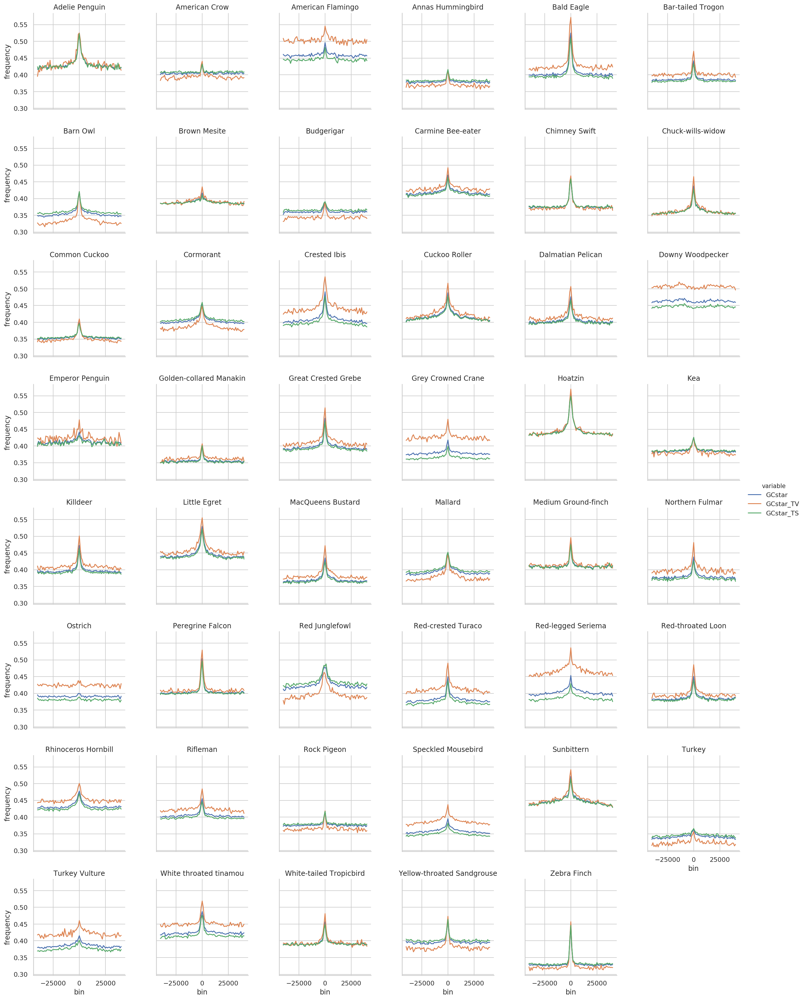

In [47]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star,
                      col='species', hue='variable',
                      col_wrap=6, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

Including CpG sites:

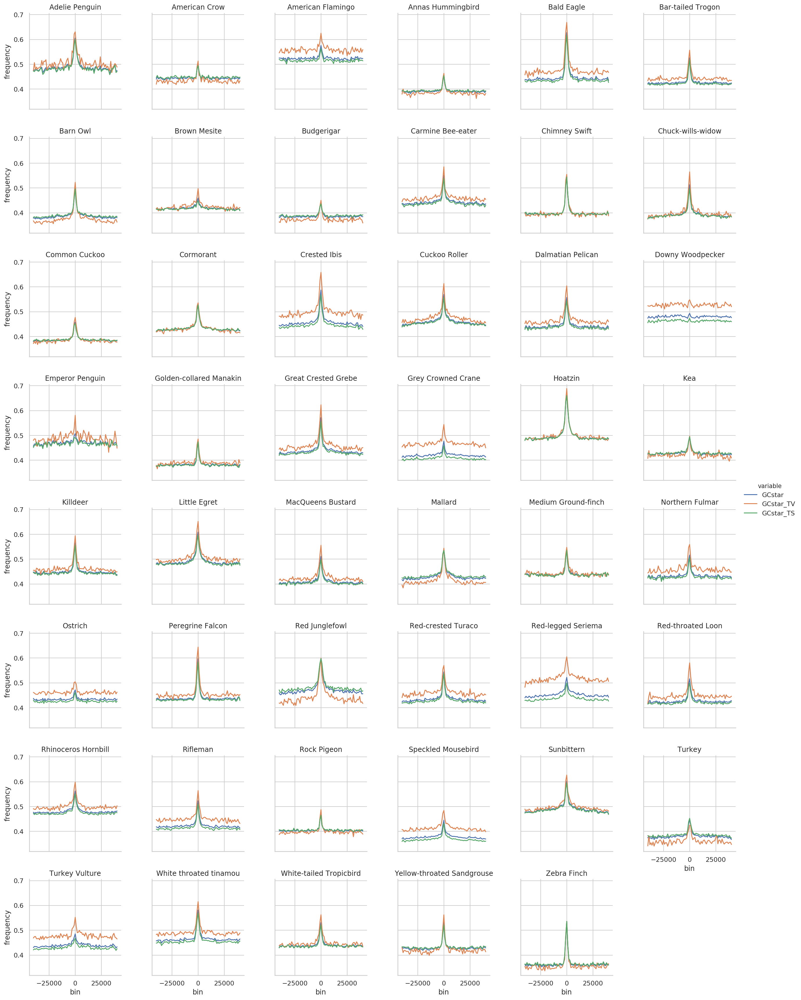

In [48]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(gc_star_incl_cpg,
                      col='species', hue='variable',
                      col_wrap=6, sharey=True)#, ylim=(0,1.2))
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

Three observations:
    
- The magnitude of the GCstar peak varies dramatically between birds. This is in part determined by the long-term species Ne.
- The Downy woodpecker does not have any peak at all. This could be due to miniscule Ne or that it does not use Zebra finch hotspots.

- The background level in flanks of GCstar differs dramatically between transversion and transitions across species. That must be because transversions can be more of less GC-biased than transitions in each species. I.e. it varies accross species how much transitions and transversion contribute to equilibrium GC content.
- The GCstar of transversions at hotspots vs flanks seems to show a slightly higher peak.

Below are larger plots of the two penguins for non-CpG sites:

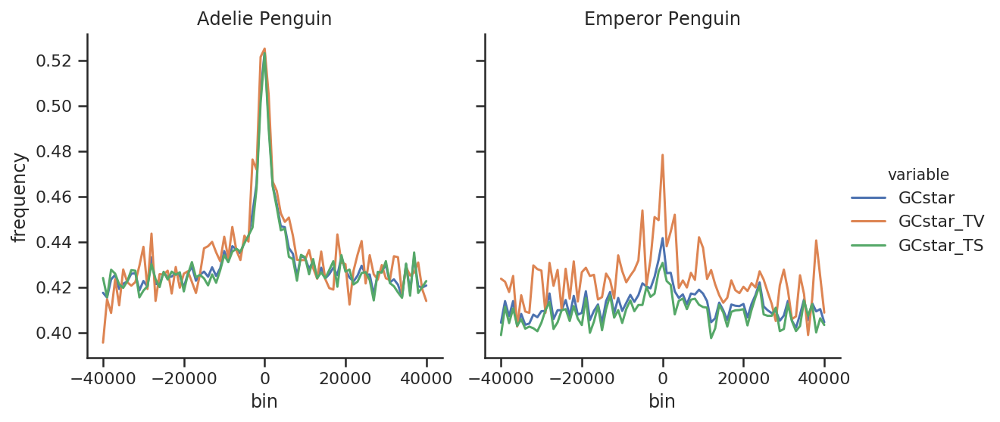

In [49]:
plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & gc_star.species_code.isin(['PYGAD', 'APTFO'])]
plot_df.species.cat.remove_unused_categories(inplace=True)

with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable', legend_out=True,
                      sharey=True, height=4, aspect=1)
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

The woodpecker and ostrich show no or almost no GCstar peaks. That could be due to extremely small long-term Ne. However, in "Temporal Dynamics of Avian Populations during Pleistocene Revealed by Whole-Genome Sequences" these two species do not seem to show any inherrent tendency for such small population sizes. Another possible reason could be that the alignment is so poor for these species that the gBGC signal is "swamped" by false positive substitutions. However, if this was the case, then the hotspot which shows the fewest aligned bases should show a peak in all rates - which is does not.

In fact, whereas the alignment quality does not seem to affect estimated rates, it does seem to be natural consequence of a higher recombination rate: more recombination will produce more structural variation that is harder to align. We analyze the dependency on alignmnet quality below.

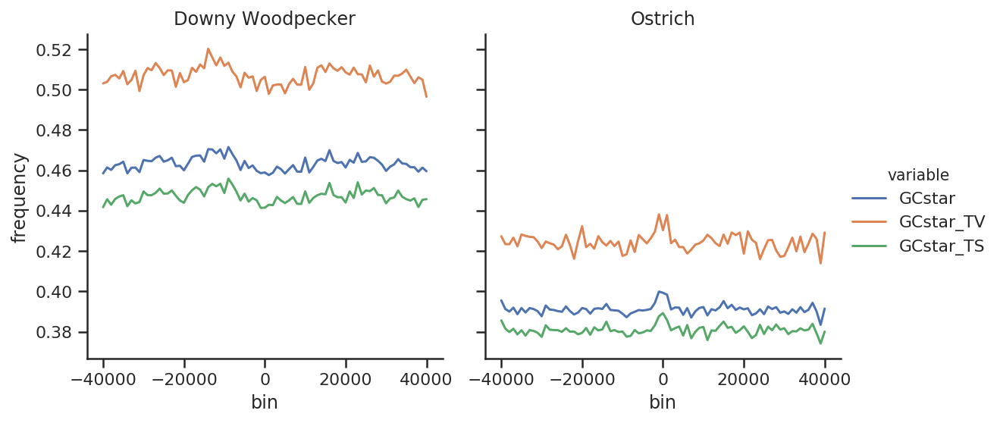

In [50]:
plot_df = gc_star.loc[(gc_star.bin.abs() <= 40000) & gc_star.species_code.isin(['PICPU', 'STRCA'])]
plot_df.species.cat.remove_unused_categories(inplace=True)

with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='variable', legend_out=True,
                      sharey=True, height=4, aspect=1)
    g.map(sns.lineplot, 'bin', 'frequency', ci=None).add_legend()
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

## GC star vs GC content of flanks

In [51]:
def get_gc_star_in_flanks(df):
    return df.loc[(df.bin.abs() < 40000) & (df.bin.abs() >= 10000)].groupby(['species', 'variable']).frequency.mean()

def get_gc_star_at_center(df):
    return df.loc[df.bin == 0].groupby(['species', 'variable']).frequency.mean()

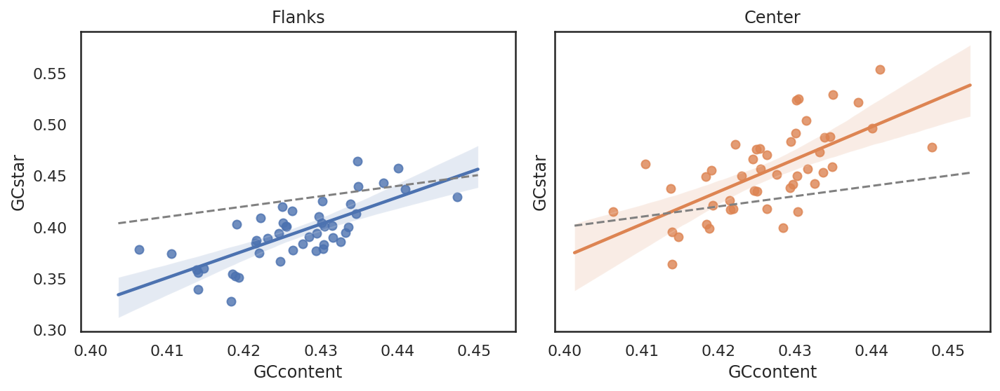

In [52]:
mean_species_gc_contents = gc_contents.to_frame(name='GCcontent').groupby('species').mean()

flanks = get_gc_star_in_flanks(gc_star).unstack()
center = get_gc_star_at_center(gc_star).unstack()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)

plot_df = mean_species_gc_contents.join(flanks)
sns.regplot(plot_df.GCcontent, plot_df.GCstar, ax=ax1)
ax1.set_title('Flanks')
abline(1, 0, ax=ax1)

plot_df = mean_species_gc_contents.join(center)
sns.regplot(plot_df.GCcontent, plot_df.GCstar, ax=ax2)
ax2.set_title('Center')
abline(1, 0, ax=ax2)
 
plt.tight_layout()

The dashed line is the diagonal. So flanks seem to be descreasing in GC content whereas centers are increasing.

## Calculate B: population scaled gBGC selection coeficient

Following box 1 in C. F. Mugal et al.: GC-biased gene conversion links the recombination landscape and demography to genomic base composition.

$$b=\frac{\ln(\frac{1-GC^*}{GC^* R})}{2(1-2N)\ln(e)} = \frac{\ln(\frac{1-GC^*}{GC^* R})}{2(1-2N)}$$

$$B \approx - \frac{\ln(\frac{1-GC^*}{GC^* R})}{4}$$


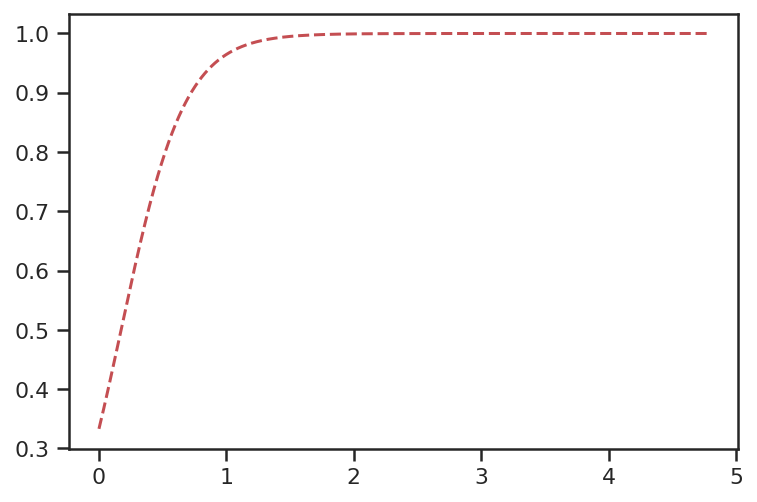

In [53]:
from math import log
import numpy as np

def b(GCstar, N, R):
    return log((1-GCstar) / (GCstar * R)) / (2*(1-2*N))

def B(GCstar, R):
    return - log((1-GCstar) / (GCstar * R)) / 4

# R = 1.5
# with sns.axes_style('ticks'):
#     x = np.linspace(0.4, 0.99999999, 10000)
#     plt.plot([b(y, 10000, R=R) for y in x], x, 'b-')
#     plt.plot([B(y, R=R)/10000 for y in x], x, 'r--')

#     plt.plot([b(y, 100000, R=R) for y in x], x, 'b-')
#     plt.plot([B(y, R=R)/100000 for y in x], x, 'r--')
#     plt.xlim(0, 5e-5)

with sns.axes_style('ticks'):
    x = np.linspace(0.333, 0.99999999, 100000)
    plt.plot([B(y, R=2) for y in x], x, 'r--')

Approach 1: Assume a relative mutation rate from GC to AT of 2 (to allow a GC content in flanks as low as 1/3)

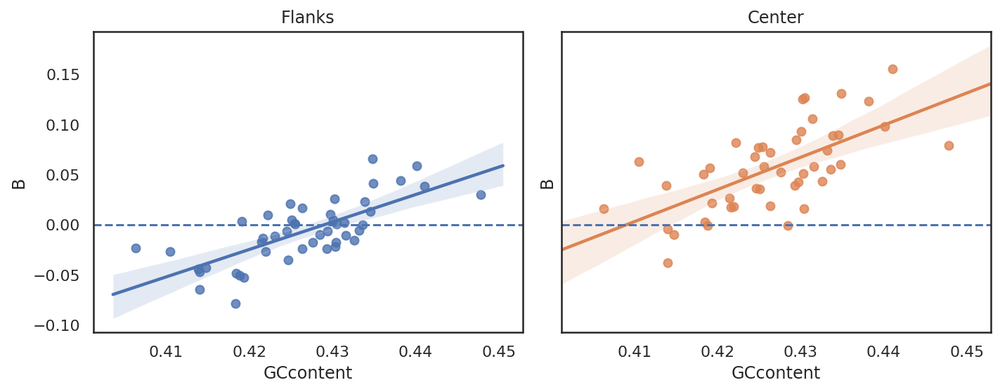

In [54]:
mean_species_gc_contents = gc_contents.to_frame(name='GCcontent').groupby('species').mean()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)

# assume an R: relative mutation rate from GC to AT
R = 1.5

plot_df_flanks = mean_species_gc_contents.join(flanks)
sns.regplot(plot_df_flanks.GCcontent, [B(x, R=R) for x in plot_df_flanks.GCstar], ax=ax1)
ax1.set_ylabel('B')
ax1.set_title('Flanks')
ax1.axhline(0, linestyle='--')

plot_df_center = mean_species_gc_contents.join(center)
sns.regplot(plot_df_center.GCcontent, [B(x, R=R) for x in plot_df_center.GCstar], ax=ax2)
ax2.set_ylabel('B')
ax2.set_title('Center')
ax2.axhline(0, linestyle='--')
 
plt.tight_layout()

Approach 2: Assume a that flanks in each species are neutral and reflect R only:

${GC}^* = 1 / (1+R)$

$R = 1 + 1/{GC}^*$

0.271104271062893

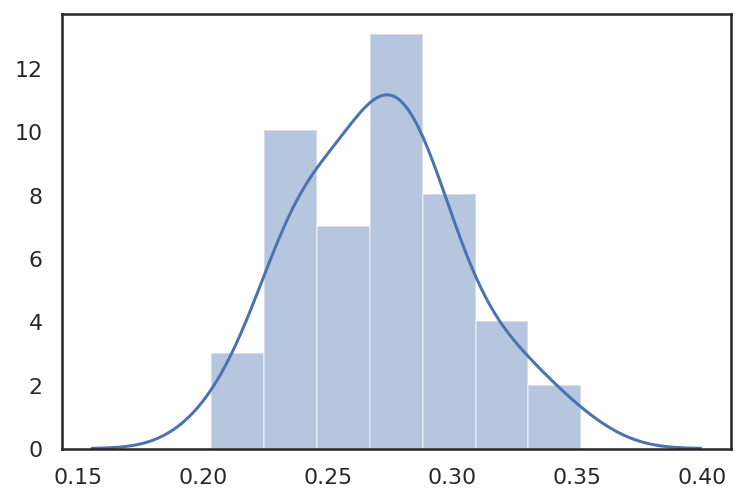

In [55]:
B_values = [B(a, 1+1/b) for (a, b) in zip(plot_df_center.GCstar, plot_df_flanks.GCstar)]
sns.distplot(B_values)
np.mean(B_values)

## GC star at hotspot relative to flanks across species

In [56]:
def compute_gc_star_ratios(df):
    flank = df.loc[(df.bin.abs() < 40000) & (df.bin.abs() >= 10000)].groupby(['species', 'variable']).frequency.mean()
    center = df.loc[df.bin == 0].groupby(['species', 'variable']).frequency.mean()
    ratios = (center / flank).reset_index().rename(columns={'frequency': 'ratio'})
    ratios_df = ratios.pivot(index='species', columns='variable', values='ratio').rename(columns=str).reset_index()
    ratios = ratios_df.melt(id_vars=['species'], var_name='variable', value_name='ratio')
    return ratios

ratios = compute_gc_star_ratios(gc_star)
ratios_incl_cpg = compute_gc_star_ratios(gc_star_incl_cpg)

ratios.head()

,species,variable,ratio
0,Adelie Penguin,GCstar,1.231865
1,American Crow,GCstar,1.074930
2,American Flamingo,GCstar,1.085699
3,Annas Hummingbird,GCstar,1.098381
4,Bald Eagle,GCstar,1.310244


In [57]:
ratio_table = ratios.pivot(index='species', columns='variable', values='ratio')
ratio_table_incl_cpg = ratios_incl_cpg.pivot(index='species', columns='variable', values='ratio')

ratio_table.head()

variable,GCstar,GCstar_TS,GCstar_TV
species,,,
Adelie Penguin,1.231865,1.232347,1.230076
American Crow,1.074930,1.058553,1.124904
American Flamingo,1.085699,1.084131,1.089900
Annas Hummingbird,1.098381,1.088587,1.124613
Bald Eagle,1.310244,1.292991,1.357128


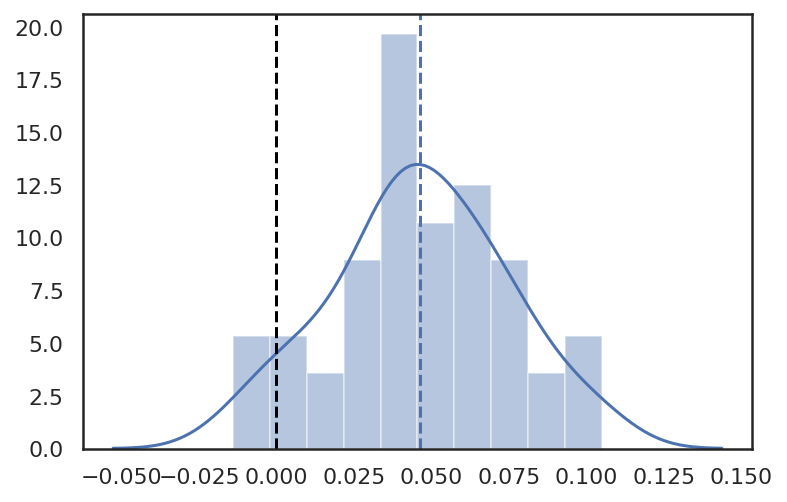

In [58]:
sns.distplot(ratio_table.GCstar_TV - ratio_table.GCstar_TS, bins=10)
plt.axvline(x=(ratio_table.GCstar_TV - ratio_table.GCstar_TS).mean(), linestyle='dashed') ;
plt.axvline(x=0, linestyle='dashed', color='black') ;

Excluding CpG sites:

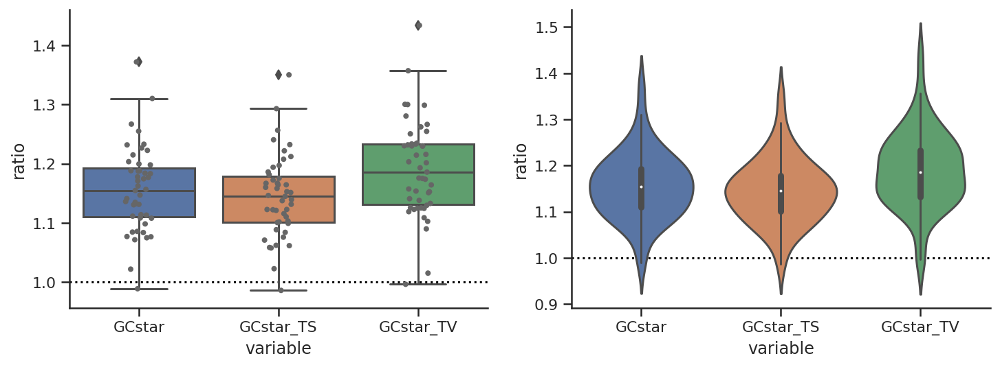

In [59]:
with sns.axes_style('ticks'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    sns.stripplot(x="variable", y="ratio", jitter=True, data=ratios, 
                  color='#666666', ax=ax1, size=4)
    sns.boxplot(x="variable", y="ratio", data=ratios, ax=ax1)
    ax1.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.violinplot(x="variable", y="ratio", data=ratios, ax=ax2)
    ax2.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.despine()

Including CpG sites:

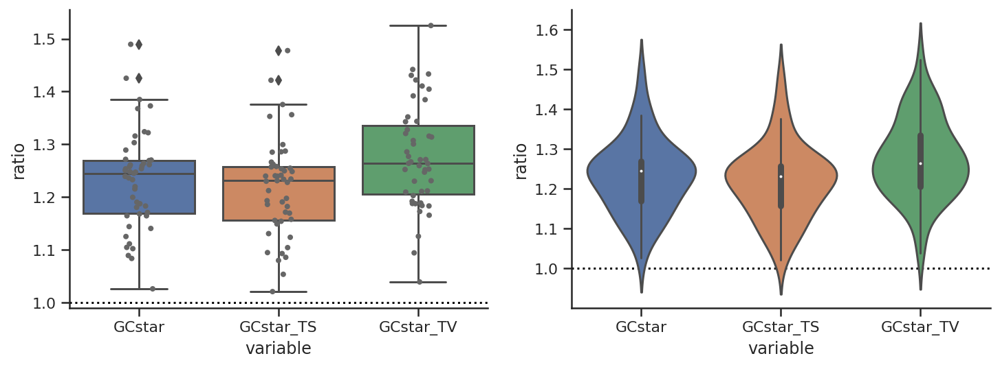

In [60]:
with sns.axes_style('ticks'):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    
    sns.stripplot(x="variable", y="ratio", jitter=True, data=ratios_incl_cpg, 
                  color='#666666', ax=ax1, size=4)
    sns.boxplot(x="variable", y="ratio", data=ratios_incl_cpg, ax=ax1)
    ax1.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.violinplot(x="variable", y="ratio", data=ratios_incl_cpg, ax=ax2)
    ax2.axhline(y=1, linestyle='dotted', color='black', zorder=0)

    sns.despine()

Significance of diference with paired t-test:

Shapiro-Wilk test for normality (second val is p) (0.989621639251709, 0.9481613039970398)


Ttest_relResult(statistic=-11.333904155607861, pvalue=6.547218777340089e-15)

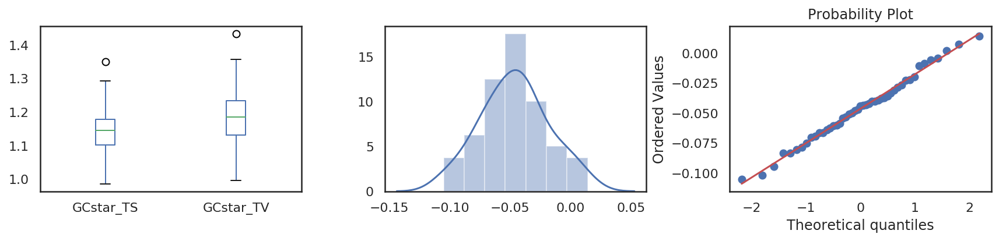

In [61]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3))

ratio_table[['GCstar_TS', 'GCstar_TV']].plot(kind='box', ax=ax1) ;

diff = ratio_table['GCstar_TS'] - ratio_table['GCstar_TV']
sns.distplot(diff, ax=ax2) ;

stats.probplot(diff, plot=ax3)

plt.tight_layout()

print("Shapiro-Wilk test for normality (second val is p)", stats.shapiro(diff))

stats.ttest_rel(ratio_table['GCstar_TS'], ratio_table['GCstar_TV'])

Same but including CpG sites:

Shapiro-Wilk test for normality (second val is p) (0.989621639251709, 0.9481613039970398)


Ttest_relResult(statistic=-11.333904155607861, pvalue=6.547218777340089e-15)

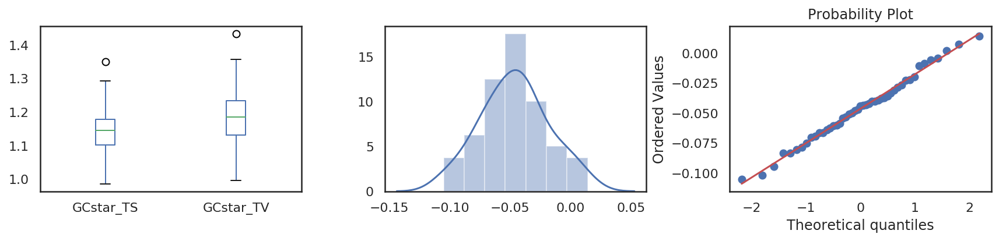

In [62]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 3))

ratio_table[['GCstar_TS', 'GCstar_TV']].plot(kind='box', ax=ax1) ;

diff = ratio_table['GCstar_TS'] - ratio_table['GCstar_TV']
sns.distplot(diff, ax=ax2) ;

stats.probplot(diff, plot=ax3)

plt.tight_layout()

print("Shapiro-Wilk test for normality (second val is p)", stats.shapiro(diff))

stats.ttest_rel(ratio_table['GCstar_TS'], ratio_table['GCstar_TV'])

## GC star at hotspot relative to flanks within each species

**TODO**

## GCstar and external branch length

Test if short branch lengths show more extreme GCstar patterns

**TODO**

## Are hotspots not overlapping CGIs less conserved across birds?

**TODO**

## Substitution rates around hotspots

In [63]:
plot_df = subst_data.loc[subst_data.species_code.isin(['PYGAD', 'APTFO'])].copy()
plot_df.species.cat.remove_unused_categories(inplace=True)
#plot_df['type'] = [plot_df.pattern.isin(transitions).tolist() and 'Transition' or 'Transversion']
plot_df.loc[plot_df.pattern.isin(transitions), 'type'] = 'Transition'
plot_df.loc[~plot_df.pattern.isin(transitions), 'type'] = 'Transversion'
plot_df.loc[:, 'type'] = pd.Categorical(plot_df.type.values, categories=['Transition', 'Transversion'], ordered=True)

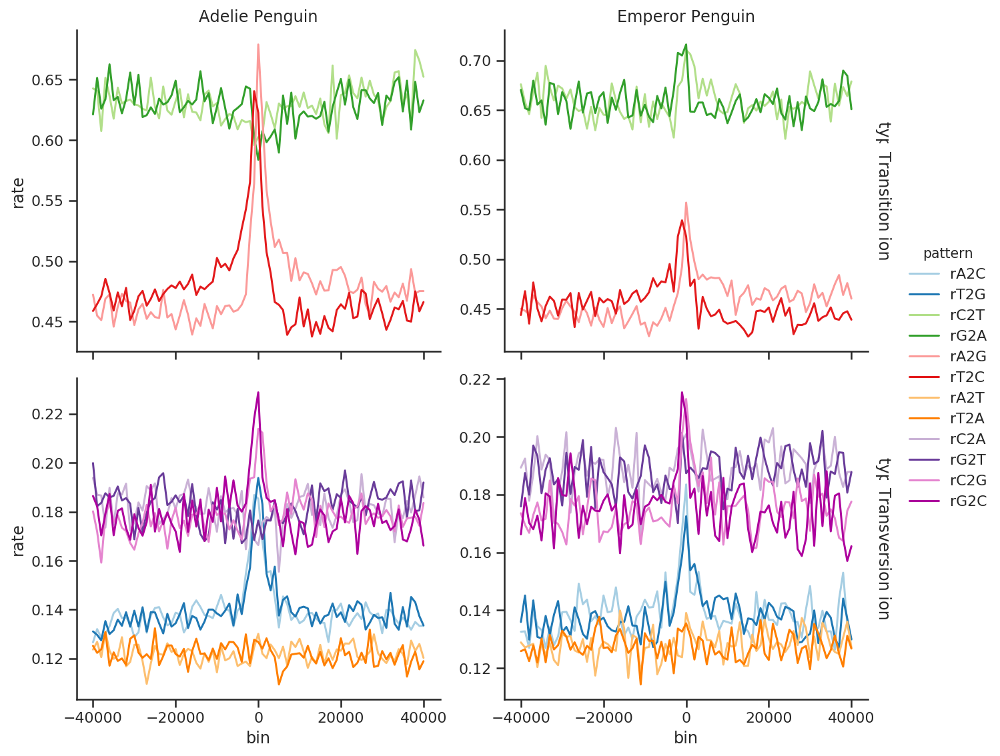

In [64]:
with sns.axes_style('ticks'):
    with sns.color_palette(Paired):
        g = sns.FacetGrid(plot_df,
                          col='species', row='type', hue='pattern',
                          legend_out=True, margin_titles=True,
                          sharey=False, height=4, aspect=1.2)
        g.map(sns.lineplot, 'bin', 'rate', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}')

Same but requiring that the number of aligned bases is at least 900

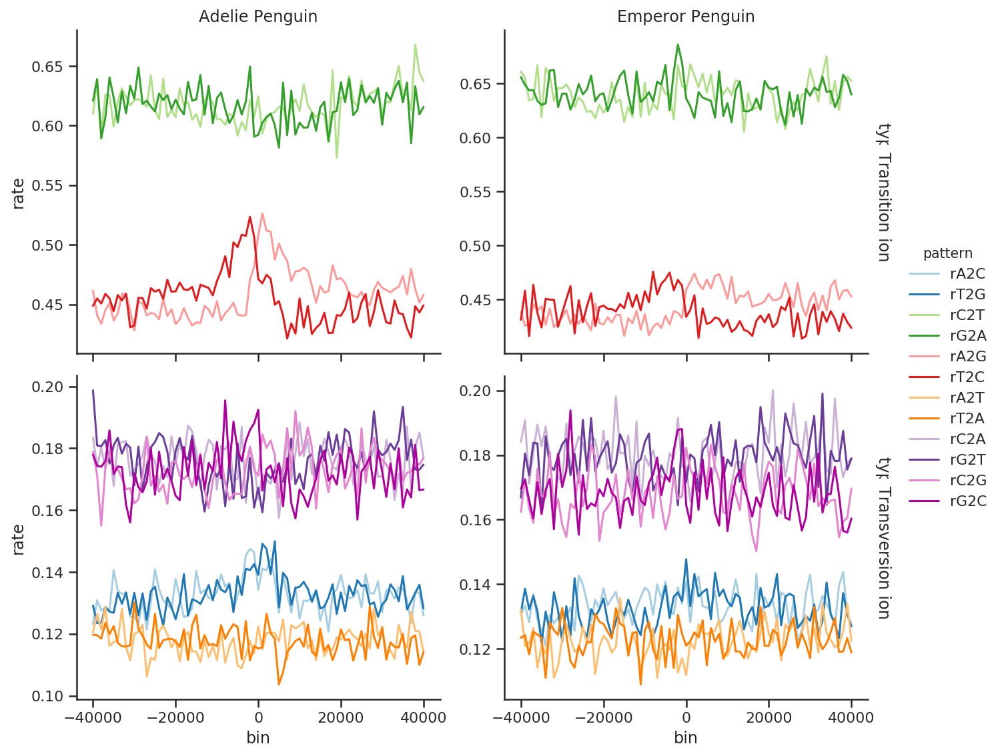

In [65]:
with sns.axes_style('ticks'):
    with sns.color_palette(Paired):
        g = sns.FacetGrid(plot_df.loc[plot_df.nr_aligned >= 900],
                          col='species', row='type', hue='pattern',
                          legend_out=True, margin_titles=True,
                          sharey=False, height=4, aspect=1.2)
        g.map(sns.lineplot, 'bin', 'rate', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}')

Note the difference in y-axis in the plots above. It seems to be the windows with fewer than 900 bases aligned (300-900) are the ones responsible for the large peak right at the center. This is probably a biological signal: windows with higher recombination have more structural variation. What is more important is that the AT conservative substututions do not seem to be affected. This suggests that the lower number of aligned bases in some windows is not due to misalignment as this would inflate all the rates at the hotspot center where there are fewest aligned bases.

Plot all rates for each species:

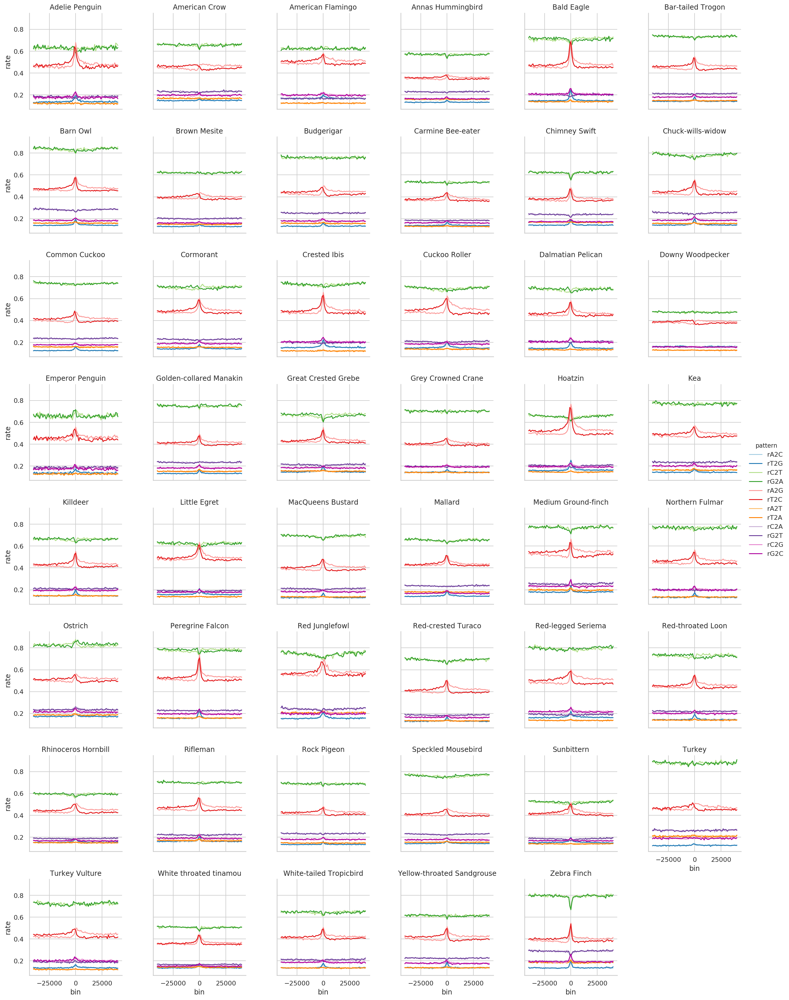

In [66]:
with sns.axes_style('whitegrid'):
    with sns.color_palette(Paired):
        g = sns.FacetGrid(subst_data,
                          col='species', hue='pattern',
                          col_wrap=6, sharey=True)#, ylim=(0,1.2))
        g.map(sns.lineplot, 'bin', 'rate', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

## Substitution rates at center of hotspots relative to flanks

In [67]:
flank = subst_data.loc[(40000 > subst_data.bin.abs()) & (subst_data.bin.abs() >= 10000)].groupby(['species', 'pattern']).rate.mean()
center = subst_data.loc[subst_data.bin == 0].groupby(['species', 'pattern']).rate.mean()
ratios = (center / flank).reset_index().rename(columns={'rate': 'ratio'})
df = ratios.pivot(index='species', columns='pattern', values='ratio').rename(columns=str).reset_index()
plot_df = df.melt(id_vars=['species'], var_name='pattern', value_name='ratio')
plot_df.head()

,species,pattern,ratio
0,Adelie Penguin,rA2C,1.359209
1,American Crow,rA2C,1.119354
2,American Flamingo,rA2C,1.137662
3,Annas Hummingbird,rA2C,1.158898
4,Bald Eagle,rA2C,1.649491


In [68]:
order=['rA2C', 'rT2G', 'rA2G', 'rT2C', 'rC2G', 'rG2C', 'rA2T', 'rT2A', 'rC2T', 'rG2A', 'rC2A', 'rG2T']

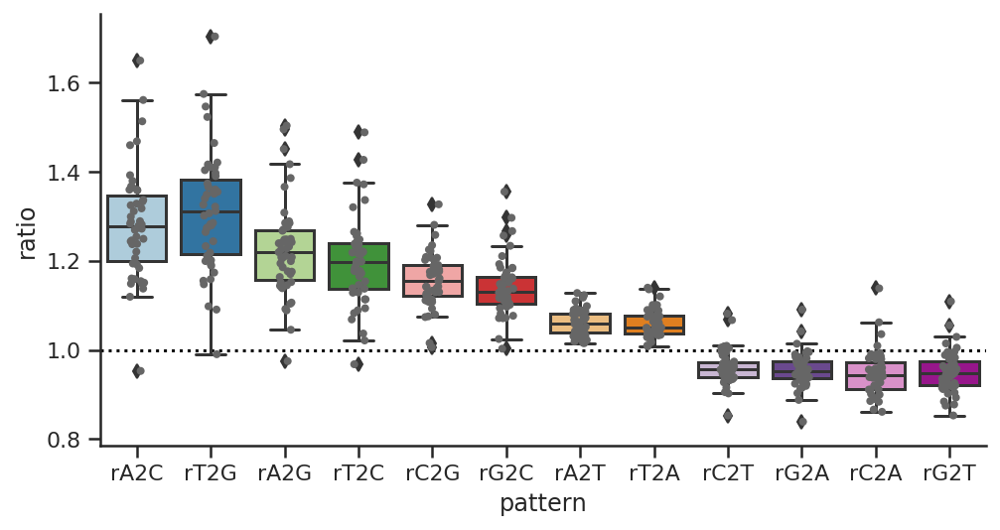

In [69]:
with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        fig, ax = plt.subplots(figsize=(8, 4))
        sns.stripplot(x="pattern", y="ratio", jitter=True, data=plot_df, 
                      color='#666666', ax=ax, size=4, order=order)
        sns.boxplot(x="pattern", y="ratio", data=plot_df, ax=ax, order=order)
        sns.despine()
        plt.axhline(y=1, linestyle='dotted', color='black', zorder=0)

It looks like the GC conservative substitutionr rates are symmetric, but that there is a slight skew in the non-conservative ones. E.g. rA2C < rT2G.

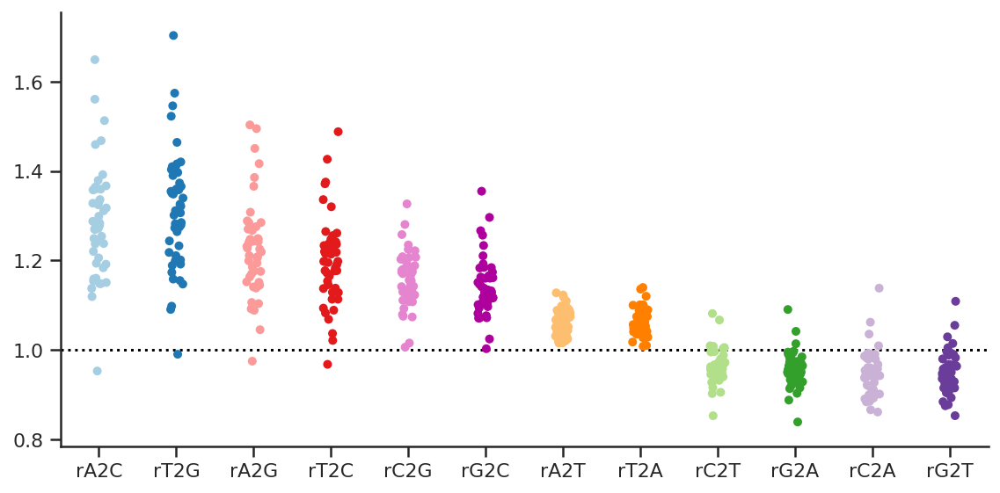

In [70]:
with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        g = sns.catplot(x="pattern", y="ratio", #col='species',# col_wrap=5, 
                      jitter=True, data=plot_df, hue='pattern',
                      height=4, aspect=2,
                      order=order
                   )
        g.map(plt.axhline, y=1, linestyle='dotted', color='black', zorder=0)

Individual species with error bars:

In [71]:
flank = subst_data.loc[(40000 > subst_data.bin.abs()) & (subst_data.bin.abs() >= 10000)].groupby(['species', 'pattern', 'hotspot_center']).rate.mean()
#flank.name = 'rate_flank'
center = subst_data.loc[subst_data.bin == 0].groupby(['species', 'pattern', 'hotspot_center']).rate.mean()
#center.name = 'rate_center'

In [72]:
len(set([x[2] for x in flank.index.values])), len(set([x[2] for x in center.index.values]))

(2848, 2641)

In [73]:
flank.head(10)

species         pattern  hotspot_center
Adelie Penguin  rA2C     86463             0.060873
                         121019            0.156390
                         147199            0.069925
                         204503            0.061664
                         291046            0.172151
                         328011            0.151658
                         365593            0.061027
                         366156            0.311420
                         401310            0.093228
                         417215            0.216521
Name: rate, dtype: float32

In [74]:
center.head(10)

species         pattern  hotspot_center
Adelie Penguin  rA2C     86463             0.000000
                         121019            0.000000
                         147199            0.228120
                         204503            0.000000
                         291046            0.662878
                         328011            0.000000
                         365593            0.000000
                         401310            0.000000
                         417215            0.000000
                         469117            0.000000
Name: rate, dtype: float32

In [75]:
df = pd.concat([flank, center], axis=1)

In [76]:
df.head()

rate      rate
species        pattern hotspot_center                    
Adelie Penguin rA2C    86463           0.060873  0.000000
                       121019          0.156390  0.000000
                       147199          0.069925  0.228120
                       204503          0.061664  0.000000
                       291046          0.172151  0.662878

In [77]:
# def boot_rel_rates(df):
#     bootstraps = list()
#     for i in range(1000):
#         _df = df.sample(frac=1, replace=True, random_state=1)
#         bootstraps.append(_df.rate_center.sum() / _df.rate_flank.sum())
#     bootstraps = pd.Series(bootstraps)
#     return pd.DataFrame(dict(mean=[bootstraps.mean()], std=[bootstraps.std()]))
    
# plot_df = df.groupby(['species', 'pattern']).apply(boot_rel_rates)
# plot_df.head()

In [78]:
ratios = (center / flank).reset_index().rename(columns={'rate': 'ratio'})

In [79]:
df = pd.pivot_table(ratios, index=['species', 'hotspot_center'], columns='pattern', values='ratio').rename(columns=str).reset_index()
plot_df = df.melt(id_vars=['species', 'hotspot_center'], var_name='pattern', value_name='ratio')
plot_df.head()

,species,hotspot_center,pattern,ratio
0,Adelie Penguin,86463,rA2C,0.000000
1,Adelie Penguin,121019,rA2C,0.000000
2,Adelie Penguin,147199,rA2C,3.262346
3,Adelie Penguin,204503,rA2C,0.000000
4,Adelie Penguin,291046,rA2C,3.850549


In [80]:


plot_df = plot_df.loc[~plot_df.ratio.isnull()]


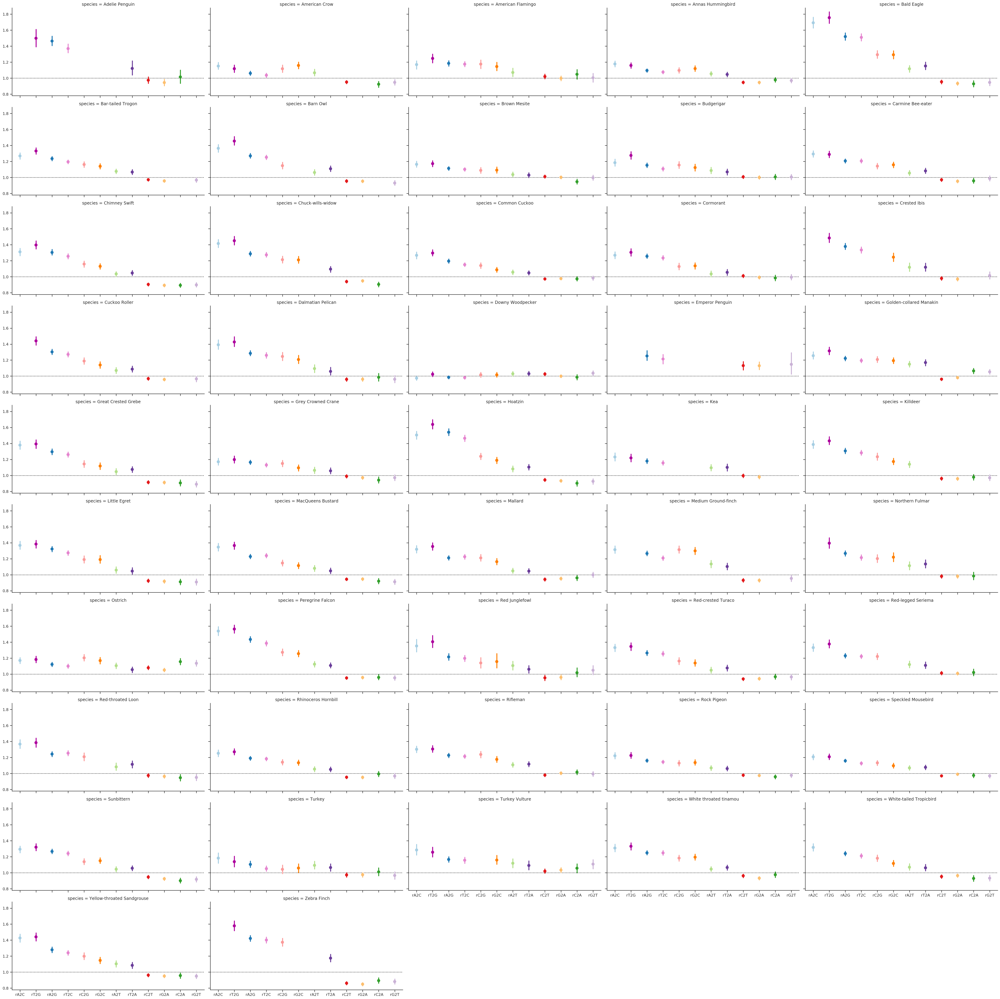

In [81]:
with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        g = sns.catplot(x="pattern", y="ratio", col='species', col_wrap=5, 
                        kind='point', join=False,
                        data=plot_df,
                        hue='pattern', s=15,
                        height=4, aspect=2,
                        order=order
                   )
        g.map(plt.axhline, y=1, linestyle='dotted', color='black', zorder=0)

In [82]:
#plot_df_subset = plot_df.loc[plot_df.species_code.isin(['APTFO', 'PYGAD'])]
plot_df_subset = plot_df.loc[plot_df.species.isin(['Adelie Penguin', 'Emperor Penguin'])]
plot_df_subset.species.cat.remove_unused_categories(inplace=True)

plot_df_subset = plot_df_subset.loc[~plot_df_subset.ratio.isnull()]

with sns.color_palette(Paired):
    with sns.axes_style('ticks'):
        g = sns.catplot(x="pattern", y="ratio", col='species', col_wrap=5, 
                      jitter=True, data=plot_df_subset,
                      hue='pattern', s=7,
                      height=4, aspect=1.5,
                      order=order
                   )
        g.map(plt.axhline, y=1, linestyle='dotted', color='black', zorder=0)

AttributeError: Can only use .cat accessor with a 'category' dtype

In [ ]:
plot_df = pd.DataFrame()
for a, b in paired_patterns:
    plot_df[f'{a}+{b}'] = (df[a] + df[b]) / 2
plot_df.head()
plot_df = plot_df.melt(var_name='pattern', value_name='ratio')

In [ ]:
order=['rT2G+rA2C', 'rA2G+rT2C', 'rC2G+rG2C', 'rA2T+rT2A', 'rC2T+rG2A', 'rG2T+rC2A']
with sns.axes_style('ticks'):
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.stripplot(x="pattern", y="ratio", jitter=True, data=plot_df, 
                  color='#666666', ax=ax, size=4, order=order)
    sns.boxplot(x="pattern", y="ratio", data=plot_df, ax=ax, order=order)
    sns.despine()
    plt.axhline(y=1, linestyle='dashed', color='black', zorder=0)

## Substitution rates toward each base

In [ ]:
# # substitution skews
# data['rate_to_C'] = data.nA2C / data.nA + data.nT2C / data.nT + data.nG2C / data.nG
# data['rate_to_G'] = data.nA2G / data.nA + data.nT2G / data.nT + data.nC2G / data.nC
# data['rate_to_A'] = data.nC2A / data.nC + data.nT2A / data.nT + data.nG2A / data.nG
# data['rate_to_T'] = data.nA2T / data.nA + data.nC2T / data.nC + data.nG2T / data.nG

## Strand bias in substitution rates

For now just the rA2G and rT2C rates divided by their sum.

In [ ]:
plot_df = rate_table[['rA2G', 'rT2C']].assign(rA2G_norm=lambda df: df.rA2G/(df.rA2G + df.rT2C),
                                              rT2C_norm=lambda df: df.rT2C/(df.rA2G + df.rT2C))
plot_df = plot_df[['rA2G_norm', 'rT2C_norm']].reset_index().melt(id_vars=['species', 'species_code', 'bin'])

In [ ]:
with sns.axes_style('ticks'):
    ax = sns.lineplot('bin', 'value', hue='pattern', ci=None, data=plot_df.loc[plot_df.species == 'Zebra Finch'])
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    sns.despine()
#     plt.axvline(0, linestyle='dashed')
    plt.legend(frameon=False)

In [ ]:
with sns.axes_style('whitegrid'):
    with sns.color_palette("Paired"):
        g = sns.FacetGrid(plot_df,
                          col='species', hue='pattern',
                          col_wrap=6, sharey=True)
        g = g.map(sns.lineplot, 'bin', 'value', ci=None).add_legend()
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}') ;

## S-jumps

In the plots above, the `rA2G` and `rT2C` are symmetric on each side. So it is maybe not the most sensible way to plot it. Here we plot their difference instead:


In [ ]:
plot_df = (rate_table[['rT2G-rA2C', 'rA2G-rT2C', 'rA2T-rT2A',
                       'rG2T-rC2A', 'rC2G-rG2C', 'rC2T-rG2A']]
           .reset_index()
           .melt(id_vars=['species', 'species_code', 'bin'], value_name='rate')
          )

In [ ]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    ax = sns.lineplot('bin', 'rate', hue='pattern', ci=None, data=plot_df.loc[plot_df.species_code == species])
    sns.despine()
    plt.axvline(0, linestyle='dashed')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., frameon=False)
    plt.title(species)

Same plot for each species:

In [ ]:
with sns.axes_style('whitegrid'):
    g = sns.FacetGrid(plot_df,
                      col='species', hue='pattern',
                      col_wrap=6, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'rate').add_legend()

The `rT2G-A2G` pattern is by far the strongest, but if the other patterns are plotted on separate scales there is a clear bias there too:

In [ ]:
with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='pattern', hue='species',
                      col_wrap=3, sharey=False, aspect=1.4)
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.1, color='black')

In [ ]:
with sns.axes_style('ticks'):
    g = sns.FacetGrid(plot_df,
                      col='pattern',
                      col_wrap=3, sharey=False, aspect=1.4)
    g = g.map(sns.lineplot, 'bin', 'rate', linewidth=0.3)

## Compute area under bias curves (total bias)

To quantify the total bias +/- 40000bp around the hotspot, we compute the area under the curve. I.e. the summed diviation from 0.5:

In [ ]:
def get_abs_area(df):
    left = np.trapz(0.5-df.loc[df.bin <= 0].rate, x=df.loc[df.bin <= 0].bin)
    right = np.trapz(df.loc[df.bin >= 0].rate-0.5, x=df.loc[df.bin >= 0].bin)
    return left + right

integrated_bias = (plot_df
                   .groupby(['species', 'species_code', 'pattern'])
                   .apply(get_abs_area)
                   .to_frame('total_bias')
                   .reset_index()
                  )

Sort by A2G-T2C bias and see if rank is preserved across all six types of bias:

In [ ]:
# plot_df = (integrated_bias
#            .pivot(index='species', columns='pattern', values='total_bias')
#            .sort_values('rA2G-rT2C')
#            .reset_index()
#            .reset_index()
#            .rename(columns={'index':'rank'})
#            .melt(id_vars=['rank', 'species', 'species_code'], value_name='total_bias')
#           )

plot_df = (pd.pivot_table(integrated_bias,
           index=['species', 'species_code'], columns='pattern', values='total_bias')
           .sort_values('rA2G-rT2C')
           .reset_index()
           .reset_index()
           .rename(columns={'index':'rank'})
           .melt(id_vars=['rank', 'species', 'species_code'], value_name='total_bias')
          )

with sns.axes_style('ticks'):
    # sorting by pattern 
    g = sns.FacetGrid(plot_df,
                      col='pattern',
                      col_wrap=3, sharey=False, sharex=True, aspect=1.4)
    g = g.map(sns.regplot, 'rank', 'total_bias', lowess=False, scatter_kws={'s':10})
    plt.xlim(left=0)
#    g.map(plt.axhline, y=0, linestyle='dashed', color='black')

That seems to be more or less the case, although there is a lot of noise because of the small signal for the other patterns. The only other one that seems to show a significant slope is `rC2G-G2C`. 

Try to sort by `rA2T-rT2A`:

In [ ]:
plot_df = (pd.pivot_table(integrated_bias,
           index=['species', 'species_code'], columns='pattern', values='total_bias')
           .sort_values('rA2T-rT2A')
           .reset_index()
           .reset_index()
           .rename(columns={'index':'rank'})
           .melt(id_vars=['rank', 'species','species_code'], value_name='total_bias')
          )

with sns.axes_style('ticks'):
    # sorting by pattern 
    g = sns.FacetGrid(plot_df,
                      col='pattern',
                      col_wrap=3, sharey=False, sharex=True, aspect=1.4)
    g = g.map(sns.regplot, 'rank', 'total_bias', lowess=False, scatter_kws={'s':10})
    plt.xlim(left=0)
#    g.map(plt.axhline, y=0, linestyle='dashed', color='black')

In [ ]:
g = sns.pairplot(pd.pivot_table(integrated_bias,
                               index=['species', 'species_code'], columns='pattern', values='total_bias')
                                 [['rT2G-rA2C', 'rA2G-rT2C', 'rA2T-rT2A',
                                   'rG2T-rC2A', 'rC2G-rG2C', 'rC2T-rG2A']], 
                 kind='reg', 
#                 plot_kws={'scatter_kws': {"s": 3, 'alpha': 0.02}}
                )

In [ ]:
# from string import ascii_letters
# import numpy as np
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# sns.set(style="white")

# # Generate a large random dataset
# rs = np.random.RandomState(33)
# d = pd.DataFrame(data=rs.normal(size=(100, 26)),
#                  columns=list(ascii_letters[26:]))

# # Compute the correlation matrix
# corr = d.corr()

# # Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(corr, dtype=np.bool))

# # Set up the matplotlib figure
# f, ax = plt.subplots(figsize=(11, 9))

# # Generate a custom diverging colormap
# cmap = sns.diverging_palette(220, 10, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Bias in base composition for comparison

In [ ]:
df = hotspot_data.loc[hotspot_data.bin.abs() <= 40000, ['species', 'species_code', 'bin', 'nC', 'nT', 'nG', 'nA']]
df['C-G'] = (df.nC-df.nG) / (df.nC + df.nG)
df['T-A'] = (df.nT-df.nA) / (df.nT + df.nA)
comp_data = df.melt(id_vars=['species', 'species_code', 'bin'], value_vars=['C-G', 'T-A'])

In [ ]:
species = 'TAEGU'
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='value', hue='variable', ci=None, data=comp_data.loc[comp_data.species_code==species])
    plt.title(species)
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)
    sns.despine()
    plt.axvline(x=0, linestyle='dashed')

Same plot for each species:

In [ ]:
with sns.color_palette("Paired"):
    g = sns.FacetGrid(comp_data,
                      col='species', hue='variable',
                      col_wrap=6, sharey=True)
    g = g.map(sns.lineplot, 'bin', 'value', ci=None).add_legend()

The bias in base composition is very similar across species, reflecting that most of bias accumulated in the ancestor to all birds.

In [ ]:
comp_table = pd.pivot_table(comp_data, index=['species', 'species_code', 'bin'], columns='variable', values='value').reset_index()
comp_table['(T-A)-(C-G)'] = comp_table['T-A'] - comp_table['C-G']

In [ ]:
species = ['TAEGU', 'PICPU', 'STRCA']
plot_df = comp_table.loc[comp_table.species_code.isin(species)]
#plot_df.species.cat.remove_unused_categories(inplace=True)
with sns.axes_style('ticks'):
    sns.lineplot(x='bin', y='(T-A)-(C-G)', hue='species', ci=None, data=plot_df)
    sns.despine()
    plt.axvline(x=0, linestyle='dashed')
    plt.legend(#bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., 
               frameon=False)

Same plot for each species:

In [ ]:
g = sns.FacetGrid(comp_table,
                  col='species', 
                  col_wrap=6, sharey=True)
g = g.map(sns.lineplot, 'bin', '(T-A)-(C-G)', ci=None).add_legend()